In [1]:
TRAIN = '/kaggle/input/crops-disease-dataset/Final_Dataset'

We want to use image embeddings for both EDA and classification, so let's add some code that will get image embeddings from ResNeXt for us.

In [2]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import numpy as np


DEVICE = torch.device('cpu')
OUTPUT_SIZE = 2048

model = models.resnext50_32x4d(weights=models.ResNeXt50_32X4D_Weights.IMAGENET1K_V2)

extraction_layer = model._modules.get('avgpool')
model.to(DEVICE)
model.eval()

scaler = transforms.Resize((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

def get_vec(arg, model, extraction_layer):
    image = normalize(to_tensor(scaler(arg))).unsqueeze(0).to(DEVICE)
    result = torch.zeros(1, OUTPUT_SIZE, 1, 1)
    def copy_data(m, i, o):
        result.copy_(o.data)
    hooked = extraction_layer.register_forward_hook(copy_data)
    with torch.no_grad():
        model(image)
    hooked.remove()
    return result

Downloading: "https://download.pytorch.org/models/resnext50_32x4d-1a0047aa.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-1a0047aa.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 145MB/s]


Let's load up all of our data, including embeddings and thumbnails. We don't have a lot of data, so we can load it all. It will take between seven and eight minutes.

In [3]:
import arrow
import base64
import pandas as pd
from glob import iglob
from io import BytesIO
from os.path import basename
from PIL import Image

THUMBNAIL_SIZE = (64, 64)

def embed(model, filename: str):
    with Image.open(fp=filename, mode='r') as image:
        return get_vec(arg=image.convert('RGB'), model=model, extraction_layer=extraction_layer).numpy().reshape(OUTPUT_SIZE,)


# https://stackoverflow.com/a/952952
def flatten(arg):
    return [x for xs in arg for x in xs]

def png(filename: str) -> str:
    with Image.open(fp=filename, mode='r') as image:
        buffer = BytesIO()
        # our images are pretty big; let's shrink the hover images to thumbnail size
        image.resize(size=THUMBNAIL_SIZE).convert('RGB').save(buffer, format='png')
        return 'data:image/png;base64,' + base64.b64encode(buffer.getvalue()).decode()

def get_picture_from_glob(arg: str, tag: str,) -> list:
    time_get = arrow.now()
    result = [pd.Series(data=[tag, basename(input_file), embed(model=model, filename=input_file), png(filename=input_file)],
                        index=['tag', 'name', 'value', 'png'])
        for index, input_file in enumerate(list(iglob(pathname=arg))) ]
    print('encoded {} rows of {}  in {}'.format(len(result), tag, arrow.now() - time_get))
    return result

time_start = arrow.now()
train_dict = {basename(folder) : folder + '/*.*' for folder in iglob(TRAIN + '/*/*')}
train_df = pd.DataFrame(data=flatten(arg=[get_picture_from_glob(arg=value, tag=key) for key, value in train_dict.items()]))
print('done in {}'.format(arrow.now() - time_start))

encoded 50 rows of Wheat_CommonRootRot  in 0:00:16.282290
encoded 50 rows of Wheat_Tanspot  in 0:00:18.387645
encoded 50 rows of Wheat_Stemfly  in 0:00:09.009983
encoded 50 rows of Wheat_Mite  in 0:00:14.437089
encoded 50 rows of Wheat_LeafBlight  in 0:00:26.241777
encoded 50 rows of Wheat_Septoria  in 0:00:25.478833
encoded 50 rows of Wheat_Healthy  in 0:00:54.546372
encoded 49 rows of Wheat_Aphid  in 0:00:13.737725
encoded 50 rows of Wheat_FusariumHeadBlight  in 0:00:09.852100
encoded 50 rows of Wheat_YellowRust  in 0:00:09.090654
encoded 50 rows of Wheat_Mildew  in 0:00:14.149758
encoded 50 rows of Wheat_BlackRust  in 0:00:58.370857
encoded 44 rows of Wheat_Blast  in 0:00:22.215283
encoded 50 rows of Wheat_Smut  in 0:00:16.418256
encoded 50 rows of Wheat_BrownRust  in 0:00:56.486885
encoded 50 rows of Corn___Northern_Leaf_Blight  in 0:00:07.874010
encoded 50 rows of Corn___Healthy  in 0:00:08.473416
encoded 50 rows of Corn___Gray_Leaf_Spot  in 0:00:07.902195
encoded 50 rows of Corn_

Next let's use TSNE to get x/y coordinates for our scatter plot.

In [4]:
from sklearn.manifold import TSNE

train_reducer = TSNE(random_state=2025, verbose=True, n_jobs=1, perplexity=20.0, init='pca')
train_df[['x', 'y']] = train_reducer.fit_transform(X=train_df['value'].apply(func=pd.Series))

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 1278 samples in 0.013s...
[t-SNE] Computed neighbors for 1278 samples in 0.250s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1278
[t-SNE] Computed conditional probabilities for sample 1278 / 1278
[t-SNE] Mean sigma: 4.370324
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.735664
[t-SNE] KL divergence after 1000 iterations: 0.731331


Now we're ready to plot.

In [5]:
from bokeh.models import ColumnDataSource
from bokeh.models import HoverTool

from bokeh.plotting import figure
from bokeh.plotting import output_notebook
from bokeh.plotting import show
from bokeh.palettes import Turbo256
from bokeh.transform import factor_cmap

output_notebook()

datasource = ColumnDataSource(train_df[['png', 'tag', 'x', 'y']])
factor_count = max(train_df['tag'].nunique(), 3)
indices = np.linspace(0, len(Turbo256)-1, factor_count, dtype=int)
palette = [Turbo256[index] for index in indices]
mapper = factor_cmap(field_name = 'tag', palette=palette, factors=train_df['tag'].unique().tolist(), start=0, end=factor_count-1, )

plot_figure = figure(title='TSNE projection: dog breeds', width=1000, height=800, tools=('pan, wheel_zoom, reset'))

plot_figure.add_tools(HoverTool(tooltips="""
<div>
    <div>
        <img src='@png' style='float: left; margin: 5px 5px 5px 5px'/>
    </div>
    <div>
        <span style='font-size: 18px'>@tag</span>
    </div>
</div>
"""))

plot_figure.scatter(x='x', y='y', source=datasource, line_alpha=0.6, fill_alpha=0.6, size=8, color=mapper)
show(plot_figure)

Loading BokehJS ...

What do we see? TSNE easily clusters the different crops into different areas of the plot, but the individual clusters are usually mixed, containing two or more kinds of images. We should have moderate expectations regarding our model accuracy. Let's build a model and find out.

In [6]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(train_df['value'].apply(pd.Series), train_df['tag'], test_size=0.25, random_state=2024, stratify=train_df['tag'])
logreg = LogisticRegression(max_iter=1000, tol=1e-12).fit(X_train, y_train)
print('model fit in {} iterations'.format(logreg.n_iter_[0]))
print('accuracy: {:5.4f}'.format(accuracy_score(y_true=y_test, y_pred=logreg.predict(X=X_test))))
print('f1: {:5.4f}'.format(f1_score(average='weighted', y_true=y_test, y_pred=logreg.predict(X=X_test))))
print(classification_report(y_true=y_test, y_pred=logreg.predict(X=X_test)))

model fit in 735 iterations
accuracy: 0.7312
f1: 0.7258
                             precision    recall  f1-score   support

         Corn___Common_Rust       0.93      1.00      0.96        13
      Corn___Gray_Leaf_Spot       0.82      0.69      0.75        13
             Corn___Healthy       0.87      1.00      0.93        13
Corn___Northern_Leaf_Blight       0.75      0.69      0.72        13
      Potato___Early_Blight       0.93      1.00      0.96        13
           Potato___Healthy       1.00      0.92      0.96        13
       Potato___Late_Blight       0.92      0.92      0.92        12
             Rice_BrownSpot       0.85      0.92      0.88        12
               Rice_Healthy       0.62      0.56      0.59         9
                 Rice_Hispa       0.60      0.69      0.64        13
             Rice_LeafBlast       0.75      0.69      0.72        13
                Wheat_Aphid       0.67      0.50      0.57        12
            Wheat_BlackRust       0.44      0.

Some of our class f1 values are quite good, but we have a few classes, particularly for wheat, are quite poor.

Let's take a look at our model probabilities.

<Axes: xlabel='probability', ylabel='Count'>

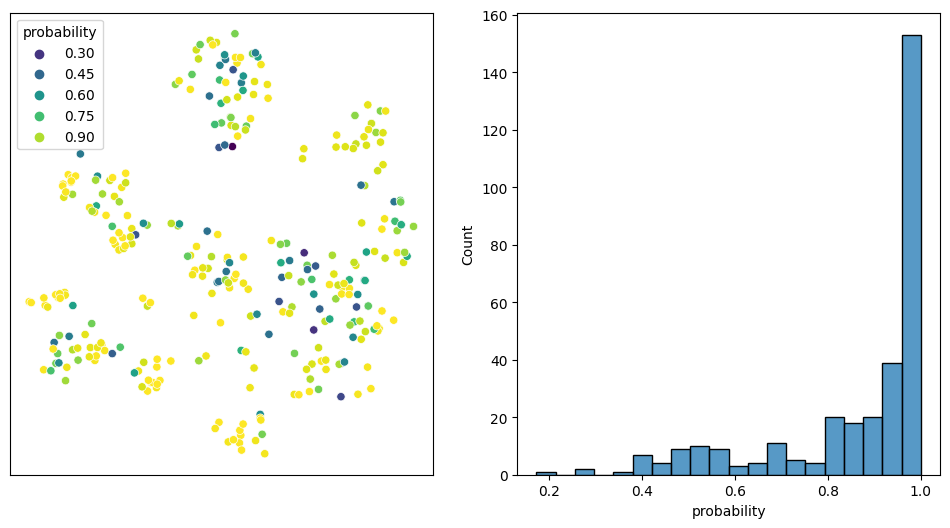

In [7]:
import matplotlib.pyplot as plt
import warnings
from seaborn import histplot
from seaborn import scatterplot

warnings.filterwarnings('ignore', category=FutureWarning, module='seaborn')


plot_df = train_df.iloc[X_test.index][['x', 'y']].copy()
plot_df['probability'] = np.max(logreg.predict_proba(X=X_test), axis=1)

plt, ax = plt.subplots(ncols=2, figsize=(12, 6))
scatterplot(ax=ax[0], data=plot_df, x='x', y='y', hue='probability', palette='viridis')
ax[0].set(xlabel=None) 
ax[0].set(ylabel=None)
ax[0].set(xticklabels=[])
ax[0].set(yticklabels=[])
ax[0].tick_params(axis='both', which='both', length=0)
histplot(ax=ax[1], data=plot_df, x='probability', bins=20)

Not surprisingly the model produces low-confidence predictions are for rice and wheat, and a few for corn.

<Axes: >

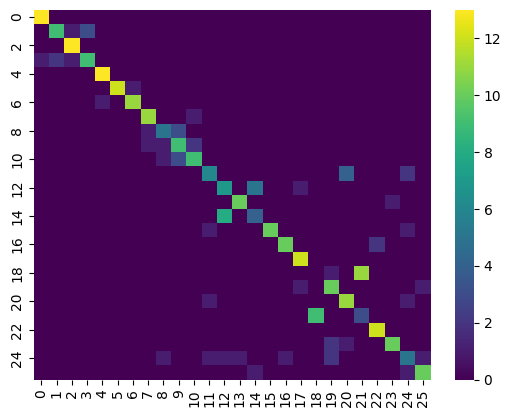

In [8]:
from seaborn import heatmap
from sklearn.metrics import confusion_matrix

heatmap(annot=False, data=pd.DataFrame(data=confusion_matrix(y_true=y_test, y_pred=logreg.predict(X=X_test), ),), cmap='viridis', fmt='2')